The datasets contains transactions made by credit cards in September 2013 by european cardholders. This dataset presents transactions that occurred in two days, where we have 492 frauds out of 284,807 transactions. The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions.

It contains only numerical input variables which are the result of a PCA transformation.
Due to confidentiality issues, there are not provided the original features and more background information about the data.


Features V1, V2, ... V28 are the principal components obtained with PCA;

The only features which have not been transformed with PCA are Time and Amount. Feature Time contains the seconds elapsed between each transaction and the first transaction in the dataset. The feature Amount is the transaction Amount, this feature can be used for example-dependant cost-senstive learning.

Feature Class is the response variable and it takes value 1 in case of fraud and 0 otherwise.

In [1]:
# Importing Libraries 

import numpy as np 
import pandas as pd 
import sklearn
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report,accuracy_score
from pylab import rcParams
import plotly
import plotly.graph_objs as go
import plotly
import plotly.figure_factory as ff
import os
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

In [2]:
## Display outputs of all commands from a cell--not just of the last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [3]:
# Reading Data
CCFD = pd.read_csv('C:/Users/HP/Downloads/creditcard.csv.zip')

# Data Cleaning 

In [4]:
CCFD.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [5]:
CCFD[CCFD.duplicated(keep=False)]

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
32,26.0,-0.529912,0.873892,1.347247,0.145457,0.414209,0.100223,0.711206,0.176066,-0.286717,...,0.046949,0.208105,-0.185548,0.001031,0.098816,-0.552904,-0.073288,0.023307,6.14,0
33,26.0,-0.529912,0.873892,1.347247,0.145457,0.414209,0.100223,0.711206,0.176066,-0.286717,...,0.046949,0.208105,-0.185548,0.001031,0.098816,-0.552904,-0.073288,0.023307,6.14,0
34,26.0,-0.535388,0.865268,1.351076,0.147575,0.433680,0.086983,0.693039,0.179742,-0.285642,...,0.049526,0.206537,-0.187108,0.000753,0.098117,-0.553471,-0.078306,0.025427,1.77,0
35,26.0,-0.535388,0.865268,1.351076,0.147575,0.433680,0.086983,0.693039,0.179742,-0.285642,...,0.049526,0.206537,-0.187108,0.000753,0.098117,-0.553471,-0.078306,0.025427,1.77,0
112,74.0,1.038370,0.127486,0.184456,1.109950,0.441699,0.945283,-0.036715,0.350995,0.118950,...,0.102520,0.605089,0.023092,-0.626463,0.479120,-0.166937,0.081247,0.001192,1.18,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283485,171627.0,-1.457978,1.378203,0.811515,-0.603760,-0.711883,-0.471672,-0.282535,0.880654,0.052808,...,0.284205,0.949659,-0.216949,0.083250,0.044944,0.639933,0.219432,0.116772,11.93,0
284190,172233.0,-2.667936,3.160505,-3.355984,1.007845,-0.377397,-0.109730,-0.667233,2.309700,-1.639306,...,0.391483,0.266536,-0.079853,-0.096395,0.086719,-0.451128,-1.183743,-0.222200,55.66,0
284191,172233.0,-2.667936,3.160505,-3.355984,1.007845,-0.377397,-0.109730,-0.667233,2.309700,-1.639306,...,0.391483,0.266536,-0.079853,-0.096395,0.086719,-0.451128,-1.183743,-0.222200,55.66,0
284192,172233.0,-2.691642,3.123168,-3.339407,1.017018,-0.293095,-0.167054,-0.745886,2.325616,-1.634651,...,0.402639,0.259746,-0.086606,-0.097597,0.083693,-0.453584,-1.205466,-0.213020,36.74,0


In [6]:
print(CCFD.duplicated().sum())

1081


In [7]:
CCFD = CCFD.drop_duplicates(keep='first')
CCFD

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


In [8]:
CCFD.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,...,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000,283726.000000
mean,94811.077600,0.005917,-0.004135,0.001613,-0.002966,0.001828,-0.001139,0.001801,-0.000854,-0.001596,...,-0.000371,-0.000015,0.000198,0.000214,-0.000232,0.000149,0.001763,0.000547,88.472687,0.001667
std,47481.047891,1.948026,1.646703,1.508682,1.414184,1.377008,1.331931,1.227664,1.179054,1.095492,...,0.723909,0.724550,0.623702,0.605627,0.521220,0.482053,0.395744,0.328027,250.399437,0.040796
min,0.000000,-56.407510,-72.715728,-48.325589,-5.683171,-113.743307,-26.160506,-43.557242,-73.216718,-13.434066,...,-34.830382,-10.933144,-44.807735,-2.836627,-10.295397,-2.604551,-22.565679,-15.430084,0.000000,0.000000
25%,54204.750000,-0.915951,-0.600321,-0.889682,-0.850134,-0.689830,-0.769031,-0.552509,-0.208828,-0.644221,...,-0.228305,-0.542700,-0.161703,-0.354453,-0.317485,-0.326763,-0.070641,-0.052818,5.600000,0.000000
50%,84692.500000,0.020384,0.063949,0.179963,-0.022248,-0.053468,-0.275168,0.040859,0.021898,-0.052596,...,-0.029441,0.006675,-0.011159,0.041016,0.016278,-0.052172,0.001479,0.011288,22.000000,0.000000
75%,139298.000000,1.316068,0.800283,1.026960,0.739647,0.612218,0.396792,0.570474,0.325704,0.595977,...,0.186194,0.528245,0.147748,0.439738,0.350667,0.240261,0.091208,0.078276,77.510000,0.000000
max,172792.000000,2.454930,22.057729,9.382558,16.875344,34.801666,73.301626,120.589494,20.007208,15.594995,...,27.202839,10.503090,22.528412,4.584549,7.519589,3.517346,31.612198,33.847808,25691.160000,1.000000


In [9]:
CCFD.shape

(283726, 31)

In [10]:
CCFD.dtypes

Time      float64
V1        float64
V2        float64
V3        float64
V4        float64
V5        float64
V6        float64
V7        float64
V8        float64
V9        float64
V10       float64
V11       float64
V12       float64
V13       float64
V14       float64
V15       float64
V16       float64
V17       float64
V18       float64
V19       float64
V20       float64
V21       float64
V22       float64
V23       float64
V24       float64
V25       float64
V26       float64
V27       float64
V28       float64
Amount    float64
Class       int64
dtype: object

In [11]:
CCFD.isnull()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
284803,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
284804,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
284805,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [12]:
CCFD.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

# Data Unbalance 

In [13]:
# Let's check data unbalance with respect with target value, i.e. Class.
temp = CCFD["Class"].value_counts()
df = pd.DataFrame({'Class': temp.index,'values': temp.values})

trace = go.Bar(
    x = df['Class'],y = df['values'],
    name="Credit Card Fraud Class - data unbalance (Not fraud = 0, Fraud = 1)",
    marker=dict(color="Blue"),
    text=df['values']
)
data = [trace]
layout = dict(title = 'Credit Card Fraud Class - data unbalance (Not fraud = 0, Fraud = 1)',
          xaxis = dict(title = 'Class', showticklabels=True), 
          yaxis = dict(title = 'Number of transactions'),
          hovermode = 'closest',width=600
         )
fig = dict(data=data, layout=layout)
iplot(fig, filename='class')

# Data Visualization 

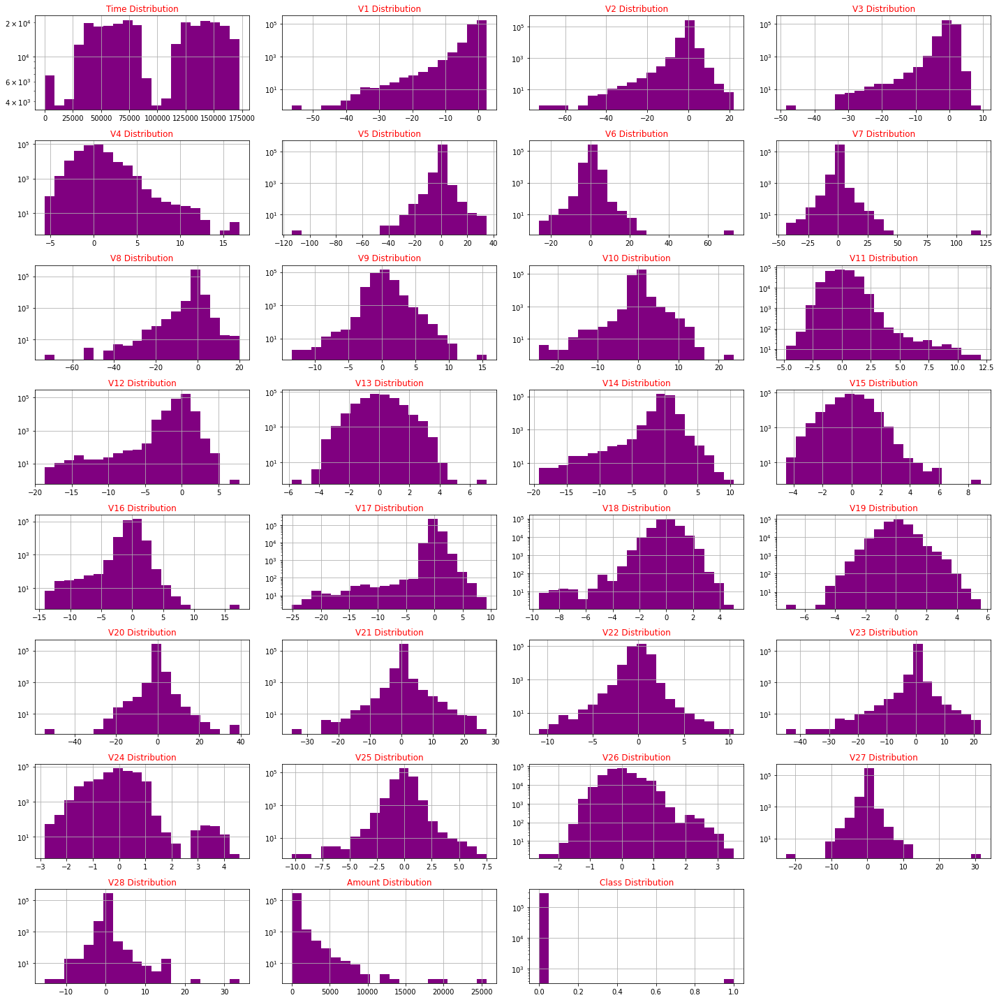

In [14]:
def draw_histograms(dataframe, features, rows, cols):
    fig=plt.figure(figsize=(20,20))
    for i, feature in enumerate(features):
        ax=fig.add_subplot(rows,cols,i+1)
        dataframe[feature].hist(bins=20,ax=ax,facecolor='Purple')
        ax.set_title(feature+" Distribution",color='Red')
        ax.set_yscale('log')
    fig.tight_layout()  
    plt.show()
draw_histograms(CCFD,CCFD.columns,8,4)

In [15]:
CCFD.Class.value_counts()

0    283253
1       473
Name: Class, dtype: int64

0 = Normal 
1 = Fraud 

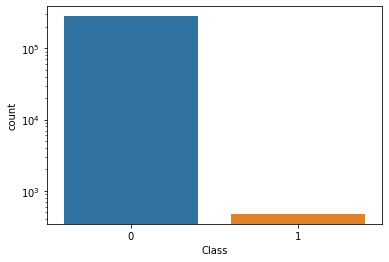

In [16]:
ax=sns.countplot(x='Class',data=CCFD);
ax.set_yscale('log')

# Transactions in time

In [17]:
import plotly.express as px
df = CCFD
fig = px.histogram(df, x=CCFD.Time, color=CCFD.Class)
fig.show()

shows the number of transactions happening per seconds 

In [18]:
class_0 = CCFD.loc[CCFD['Class'] == 0]["Time"]
class_1 = CCFD.loc[CCFD['Class'] == 1]["Time"]

hist_data = [class_0, class_1]
group_labels = ['Not Fraud', 'Fraud']

fig = ff.create_distplot(hist_data, group_labels, show_hist=False, show_rug=False)
fig['layout'].update(title='Credit Card Transactions Time Density Plot', xaxis=dict(title='Time [s]'))
fig.show();

we can clearly see from the figure above that, Fraudulent transactions have a distribution more even than valid transactions

In [19]:
CCFD['Hour'] = CCFD['Time'].apply(lambda x: np.floor(x / 3600))

tmp = CCFD.groupby(['Hour', 'Class'])['Amount'].aggregate(['min', 'max', 'count', 'sum', 'mean', 'median', 'var']).reset_index()
df = pd.DataFrame(tmp)
df.columns = ['Hour', 'Class', 'Min', 'Max', 'Transactions', 'Sum', 'Mean', 'Median', 'Var']
df.head()

,Hour,Class,Min,Max,Transactions,Sum,Mean,Median,Var
0,0.0,0,0.0,7712.43,3929,255825.95,65.112230,12.990,45961.838558
1,0.0,1,0.0,529.00,2,529.00,264.500000,264.500,139920.500000
2,1.0,0,0.0,1769.69,2211,145744.59,65.917951,23.000,20085.295527
3,1.0,1,59.0,239.93,2,298.93,149.465000,149.465,16367.832450
4,2.0,0,0.0,4002.88,1552,106983.39,68.932597,17.985,45434.509936


converted the seconds into hours to have better understanding of data

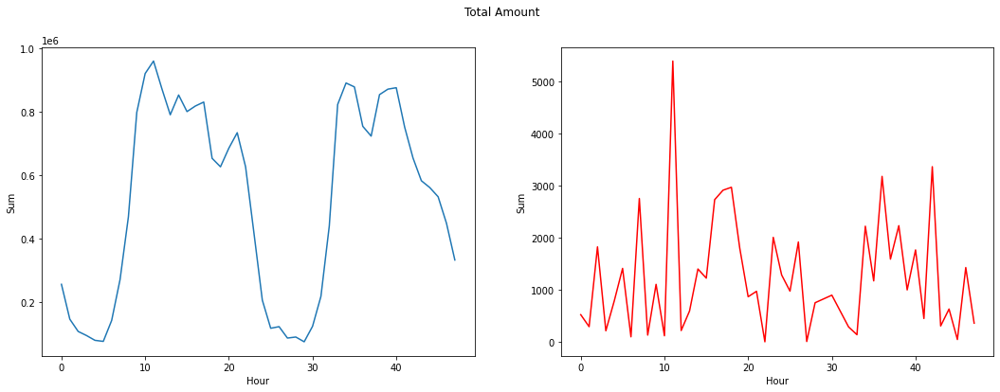

In [20]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18,6))
s = sns.lineplot(ax = ax1, x="Hour", y="Sum", data=df.loc[df.Class==0])
s = sns.lineplot(ax = ax2, x="Hour", y="Sum", data=df.loc[df.Class==1], color="red")
plt.suptitle("Total Amount")
plt.show();

this shows number of transactions per hour for both fraud and normal cases. 

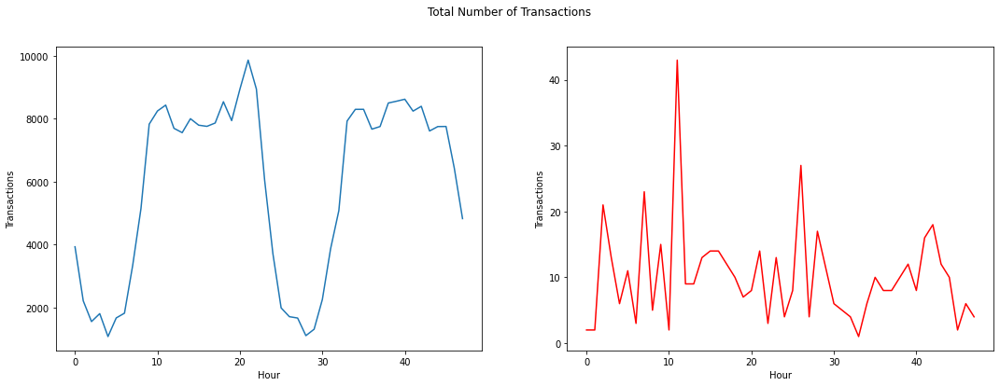

In [21]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18,6))
s = sns.lineplot(ax = ax1, x="Hour", y="Transactions", data=df.loc[df.Class==0])
s = sns.lineplot(ax = ax2, x="Hour", y="Transactions", data=df.loc[df.Class==1], color="red")
plt.suptitle("Total Number of Transactions")
plt.show();

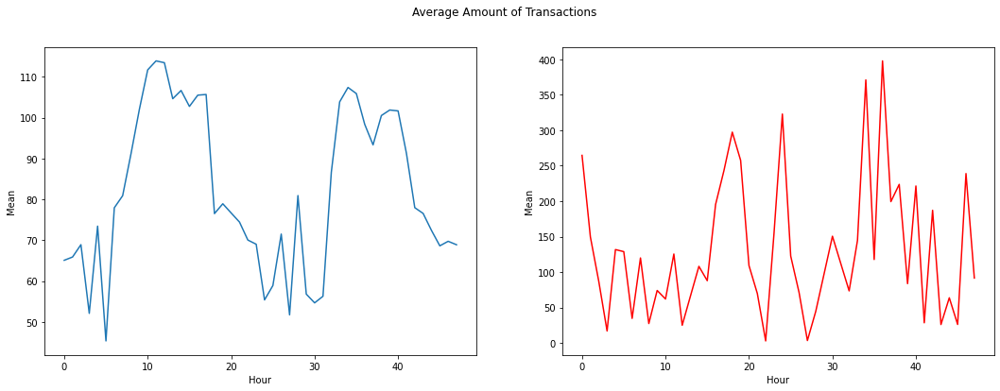

In [22]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18,6))
s = sns.lineplot(ax = ax1, x="Hour", y="Mean", data=df.loc[df.Class==0])
s = sns.lineplot(ax = ax2, x="Hour", y="Mean", data=df.loc[df.Class==1], color="red")
plt.suptitle("Average Amount of Transactions")
plt.show();

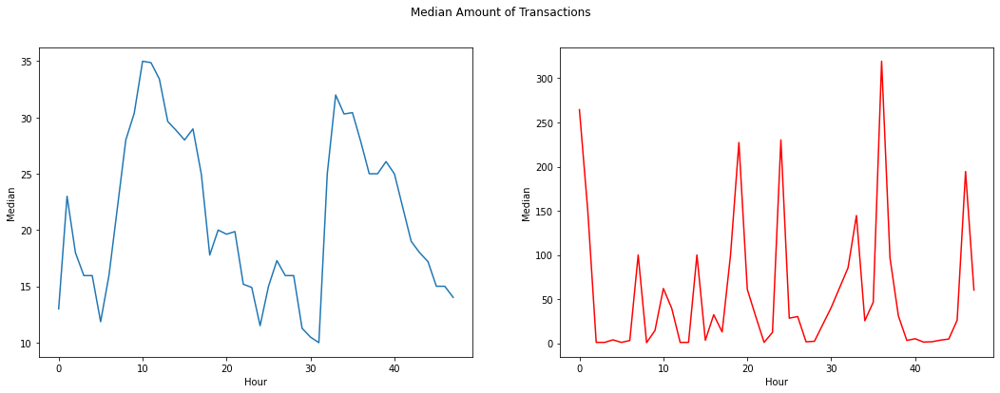

In [23]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18,6))
s = sns.lineplot(ax = ax1, x="Hour", y="Median", data=df.loc[df.Class==0])
s = sns.lineplot(ax = ax2, x="Hour", y="Median", data=df.loc[df.Class==1], color="red")
plt.suptitle("Median Amount of Transactions")
plt.show();

# Normal and Fraud Cases 

In [24]:
Fraud = CCFD[CCFD['Class']==1]
Normal = CCFD[CCFD['Class']==0]

In [25]:
print('Fraud Shape:\t', Fraud.shape)
print('Normal Shape:\t', Normal.shape)

Fraud Shape:	 (473, 32)
Normal Shape:	 (283253, 32)


# Fraud 

In [26]:
pd.concat([Fraud.Amount.describe(), Fraud.Time.describe()],  axis=1)

,Amount,Time
count,473.000000,473.000000
mean,123.871860,80450.513742
std,260.211041,48636.179973
min,0.000000,406.000000
25%,1.000000,41203.000000
50%,9.820000,73408.000000
75%,105.890000,129095.000000
max,2125.870000,170348.000000


In [27]:
df = Fraud
fig = px.histogram(df,Fraud.Amount,
                   title='Amount of Transaction (Fraud)',
                   opacity=0.8,
                   color_discrete_sequence=['Blue'] # color of histogram bars
                   )
fig.show()

this graph shows the number of fraud transactions and the amount of those fraud transactions, as we can clearly see that most of the faud transactions values less than Rs. 500

<Figure size 2880x1440 with 0 Axes>

<AxesSubplot:>

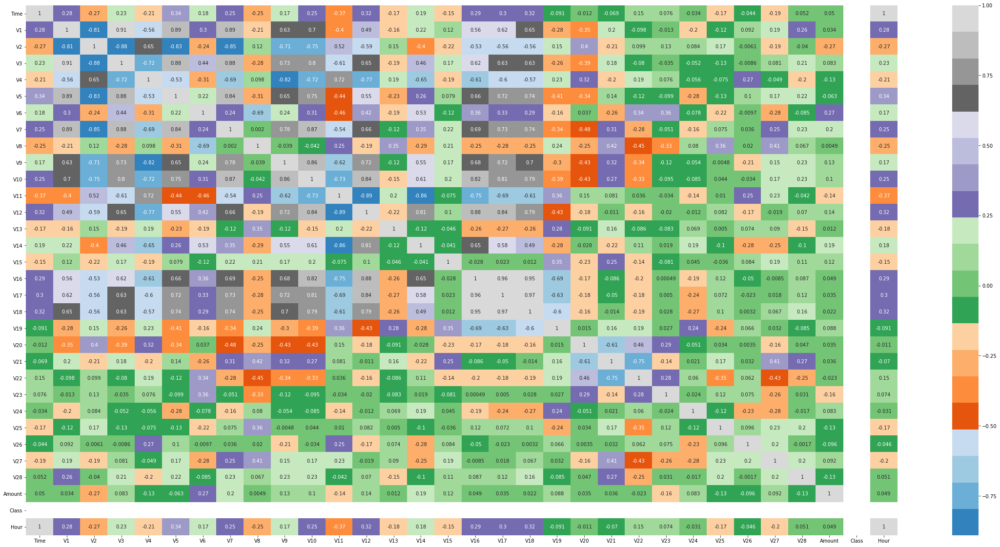

In [28]:
plt.figure(figsize = (40,20))
sns.heatmap(Fraud.corr(), annot = True, cmap="tab20c")
plt.show()

# Normal 

In [29]:
pd.concat([Normal.Amount.describe(), Normal.Time.describe()],  axis=1)

,Amount,Time
count,283253.000000,283253.000000
mean,88.413575,94835.058093
std,250.379023,47475.550607
min,0.000000,0.000000
25%,5.670000,54233.000000
50%,22.000000,84711.000000
75%,77.460000,139308.000000
max,25691.160000,172792.000000


In [30]:
import plotly.express as px
df = Normal
fig = px.histogram(df,Normal.Amount,
                   title='Amount of Transactions (Normal)',
                   opacity=0.8,
                   color_discrete_sequence=['Purple'] # color of histogram bars
                   )
fig.show()

<Figure size 2880x1440 with 0 Axes>

<AxesSubplot:>

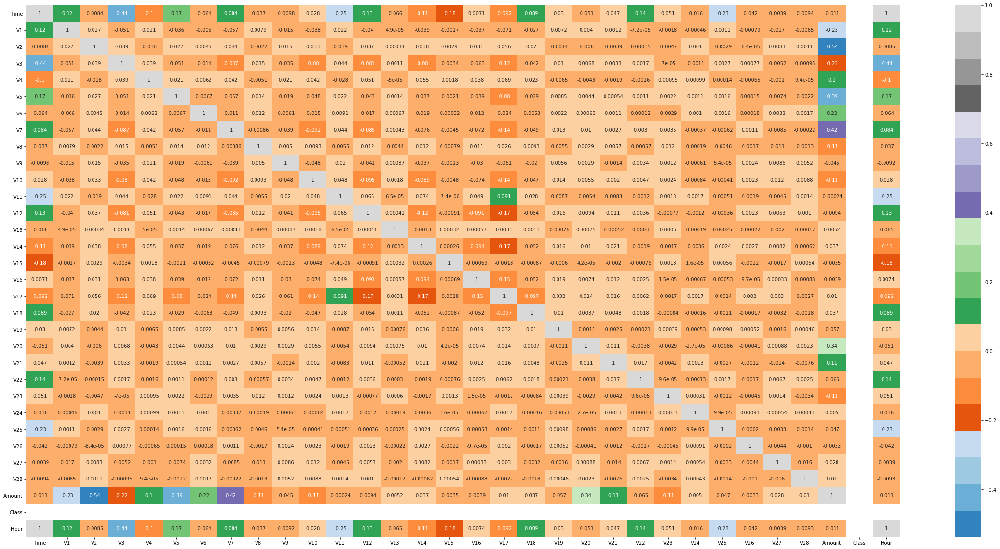

In [31]:
plt.figure(figsize = (40,20))
sns.heatmap(Normal.corr(), annot = True, cmap="tab20c")
plt.show()

# Transactions amount

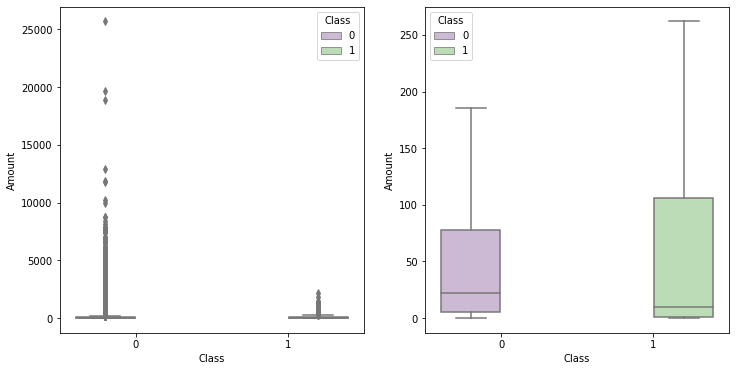

In [32]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))
s = sns.boxplot(ax = ax1, x="Class", y="Amount", hue="Class",data=CCFD, palette="PRGn",showfliers=True)
s = sns.boxplot(ax = ax2, x="Class", y="Amount", hue="Class",data=CCFD, palette="PRGn",showfliers=False)
plt.show();

In [33]:
tmp = CCFD[['Amount','Class']].copy()
class_0 = tmp.loc[tmp['Class'] == 0]['Amount']
class_1 = tmp.loc[tmp['Class'] == 1]['Amount']
class_0.describe()
class_1.describe()

count    283253.000000
mean         88.413575
std         250.379023
min           0.000000
25%           5.670000
50%          22.000000
75%          77.460000
max       25691.160000
Name: Amount, dtype: float64

count     473.000000
mean      123.871860
std       260.211041
min         0.000000
25%         1.000000
50%         9.820000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64

From the description above we can conclude that, The real transaction have a larger mean value, larger Q1, smaller Q3 and Q4 and larger outliers; fraudulent transactions have a smaller Q1 and mean, larger Q4 and smaller outliers.

In [34]:
fraud = CCFD.loc[CCFD['Class'] == 1]

trace = go.Scatter(
    x = fraud['Time'],y = fraud['Amount'],
    name="Amount",
     marker=dict(
                color='rgb(238,23,11)',
                line=dict(
                    color='red',
                    width=1),
                opacity=0.5,
            ),
    text= fraud['Amount'],
    mode = "markers"
)
data = [trace]
layout = dict(title = 'Amount of fraudulent transactions',
          xaxis = dict(title = 'Time [s]', showticklabels=True), 
          yaxis = dict(title = 'Amount'),
          hovermode='closest'
         )
fig = dict(data=data, layout=layout)
iplot(fig, filename='fraud-amount')

In [ ]:
this graph shows the fraud transcations at the time they happened  

# Correlation Matrix

<Figure size 3600x3600 with 0 Axes>

Text(0.5, 1.0, 'Credit Card Transactions features correlation plot (Pearson)')

<AxesSubplot:title={'center':'Credit Card Transactions features correlation plot (Pearson)'}>

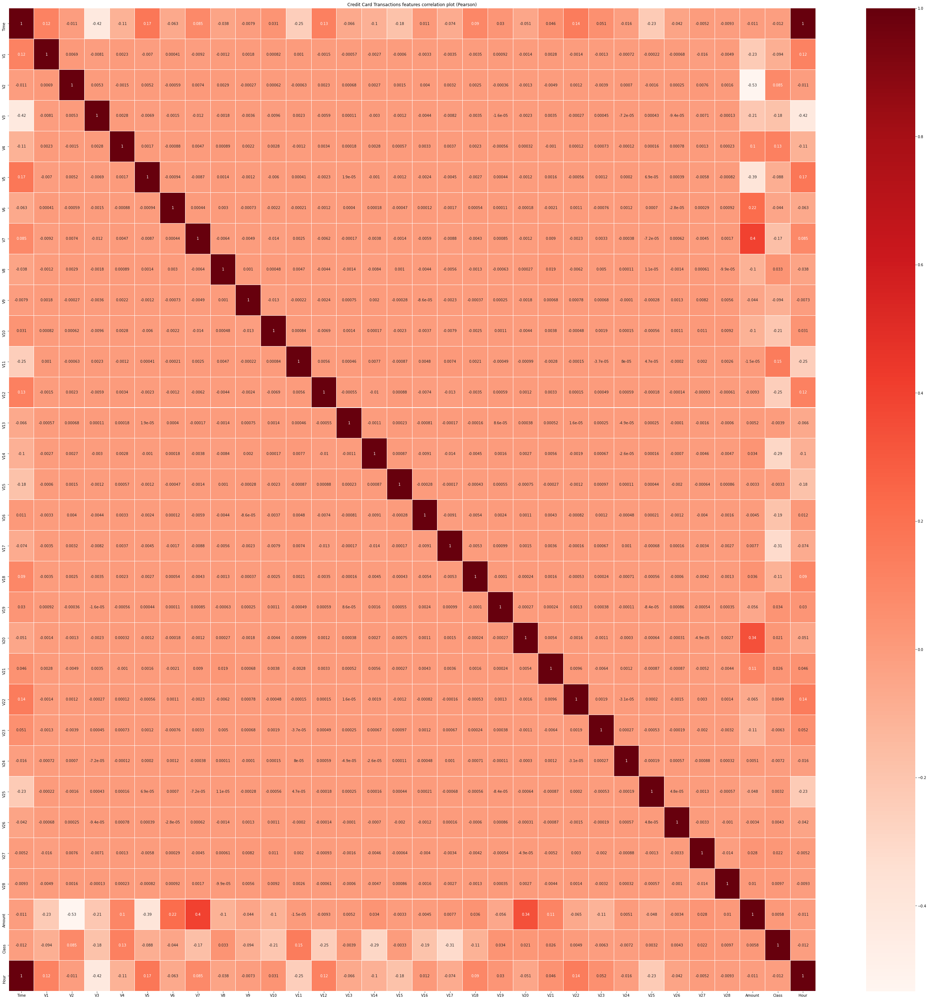

In [35]:
plt.figure(figsize = (50,50))
plt.title('Credit Card Transactions features correlation plot (Pearson)')
corr = CCFD.corr()
sns.heatmap(corr,xticklabels=corr.columns,yticklabels=corr.columns,linewidths=.1, annot = True, cmap="Reds")
plt.show()

As expected, there is no notable correlation between features V1-V28. There are certain correlations between some of these features and Time (inverse correlation with V3) and Amount (direct correlation with V7 and V20, inverse correlation with V1 and V5).

Let's plot the correlated and inverse correlated values on the same graph.

Let's start with the direct correlated values: {V20;Amount} and {V7;Amount}.

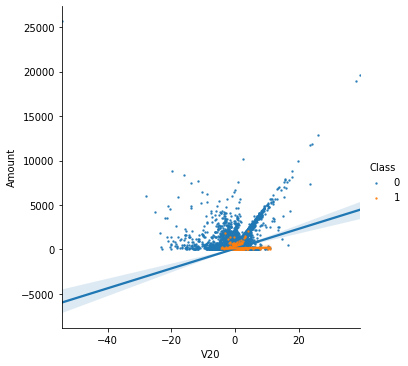

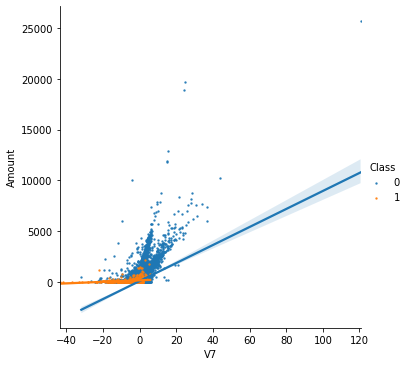

In [36]:
s = sns.lmplot(x='V20', y='Amount',data=CCFD, hue='Class', fit_reg=True,scatter_kws={'s':2})
s = sns.lmplot(x='V7', y='Amount',data=CCFD, hue='Class', fit_reg=True,scatter_kws={'s':2})
plt.show()

We can confirm that the two couples of features are correlated (the regression lines for Class = 0 have a positive slope, whilst the regression line for Class = 1 have a smaller positive slope).

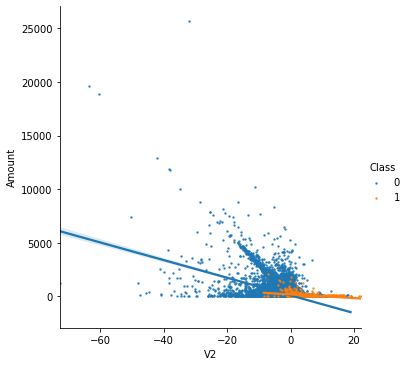

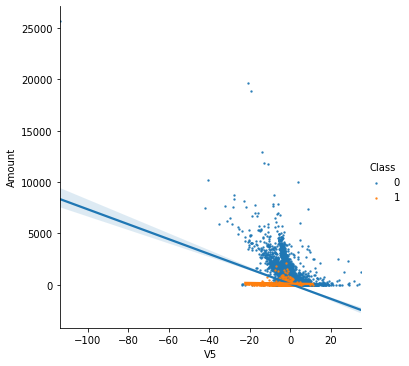

In [37]:
s = sns.lmplot(x='V2', y='Amount',data=CCFD, hue='Class', fit_reg=True,scatter_kws={'s':2})
s = sns.lmplot(x='V5', y='Amount',data=CCFD, hue='Class', fit_reg=True,scatter_kws={'s':2})
plt.show()

We can confirm that the two couples of features are inverse correlated (the regression lines for Class = 0 have a negative slope while the regression lines for Class = 1 have a very small negative slope).

# Features density plot

c:\python36\lib\site-packages\seaborn\distributions.py:1657: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.

c:\python36\lib\site-packages\seaborn\distributions.py:1657: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.

c:\python36\lib\site-packages\seaborn\distributions.py:1657: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.

c:\python36\lib\site-packages\seaborn\distributions.py:1657: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.

c:\pytho

c:\python36\lib\site-packages\seaborn\distributions.py:1657: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.

c:\python36\lib\site-packages\seaborn\distributions.py:1657: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.

c:\python36\lib\site-packages\seaborn\distributions.py:1657: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.

c:\python36\lib\site-packages\seaborn\distributions.py:1657: FutureWarning:

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.5 for `bw_method`, but please see the docs for the new parameters and update your code.

c:\pytho

<Figure size 432x288 with 0 Axes>

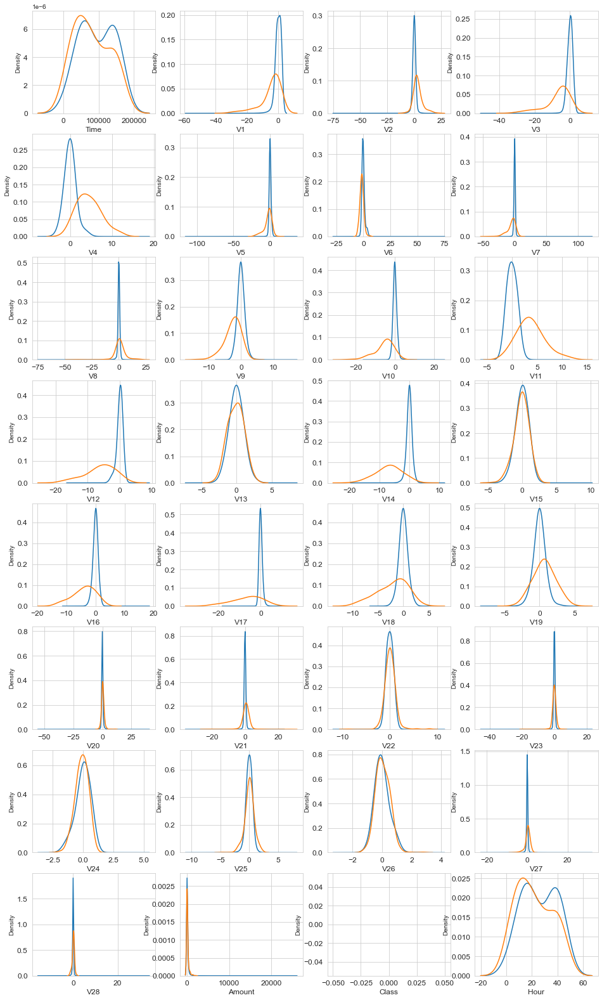

In [38]:
var = CCFD.columns.values

i = 0
t0 = CCFD.loc[CCFD['Class'] == 0]
t1 = CCFD.loc[CCFD['Class'] == 1]

sns.set_style('whitegrid')
plt.figure()
fig, ax = plt.subplots(8,4,figsize=(16,28))

for feature in var:
    i += 1
    plt.subplot(8,4,i)
    sns.kdeplot(t0[feature], bw=0.5,label="Class = 0")
    sns.kdeplot(t1[feature], bw=0.5,label="Class = 1")
    plt.xlabel(feature, fontsize=12)
    locs, labels = plt.xticks()
    plt.tick_params(axis='both', which='major', labelsize=12)
plt.show();

For some of the features we can observe a good selectivity in terms of distribution for the two values of Class: V4, V11 have clearly separated distributions for Class values 0 and 1, V12, V14, V18 are partially separated, V1, V2, V3, V10 have a quite distinct profile, whilst V25, V26, V28 have similar profiles for the two values of Class.

In general, with just few exceptions (Time and Amount), the features distribution for legitimate transactions (values of Class = 0) is centered around 0, sometime with a long queue at one of the extremities. In the same time, the fraudulent transactions (values of Class = 1) have a skewed (asymmetric) distribution.

# Models 

# Logistic Regression

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [40]:
Normal_sample = Normal.sample(n=473)

In [41]:
#Concatenating two DataFrames

In [42]:
new_CCFD = pd.concat([Normal_sample, Fraud], axis=0)

In [43]:
new_CCFD.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Hour
118755,75202.0,1.336749,0.146760,-0.505615,-0.236427,0.416528,-0.477542,0.409695,-0.300863,-0.149755,...,-1.513307,-0.006482,-0.963185,0.314129,0.701502,-0.101552,-0.002243,39.99,0,20.0
157702,110301.0,-0.427933,-0.139430,1.913618,-1.565992,-0.243006,-0.799457,0.287820,-0.335952,-0.050298,...,0.415276,-0.244222,0.511446,0.645283,-0.185989,-0.283862,-0.297316,45.85,0,30.0
8005,10992.0,1.208873,-0.228874,0.516676,0.225931,-0.575962,-0.218116,-0.431631,-0.003734,1.951501,...,-0.294811,-0.107319,0.016209,0.399851,1.077377,-0.106665,-0.018677,24.35,0,3.0
199213,132854.0,1.984692,-1.876668,-1.189839,-1.177557,-1.380372,-0.579417,-0.795169,-0.217612,-1.198796,...,0.577398,-0.104263,0.135135,0.187168,0.088471,-0.022392,-0.051460,150.00,0,36.0
275148,166393.0,-0.913060,-6.360316,-3.063644,-1.820490,-1.667637,1.800875,0.912154,0.053255,1.155869,...,-1.862508,-0.887179,-0.952050,-1.055242,-1.332110,-0.155169,0.217606,1549.64,0,46.0


In [44]:
new_CCFD['Class'].value_counts()

1    473
0    473
Name: Class, dtype: int64

In [45]:
new_CCFD.groupby('Class').mean()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Hour
Class,,,,,,,,,,,,,,,,,,,,,
0,94086.279070,-0.034027,-0.032563,0.017806,-0.042255,-0.002652,0.037172,-0.001572,0.011574,-0.045807,...,-0.03962,0.045170,0.026301,-0.018616,0.036486,0.011321,0.002008,-0.021526,93.425307,25.627907
1,80450.513742,-4.498280,3.405965,-6.729599,4.472591,-2.957197,-1.432518,-5.175912,0.953255,-2.522124,...,0.46655,0.086639,-0.096464,-0.106643,0.040615,0.050456,0.213774,0.078270,123.871860,21.854123


In [46]:
X = new_CCFD.drop(columns='Class', axis=1)
Y = new_CCFD['Class']

In [47]:
print(X)

            Time        V1        V2        V3        V4        V5        V6  \
118755   75202.0  1.336749  0.146760 -0.505615 -0.236427  0.416528 -0.477542   
157702  110301.0 -0.427933 -0.139430  1.913618 -1.565992 -0.243006 -0.799457   
8005     10992.0  1.208873 -0.228874  0.516676  0.225931 -0.575962 -0.218116   
199213  132854.0  1.984692 -1.876668 -1.189839 -1.177557 -1.380372 -0.579417   
275148  166393.0 -0.913060 -6.360316 -3.063644 -1.820490 -1.667637  1.800875   
...          ...       ...       ...       ...       ...       ...       ...   
279863  169142.0 -1.927883  1.125653 -4.518331  1.749293 -1.566487 -2.010494   
280143  169347.0  1.378559  1.289381 -5.004247  1.411850  0.442581 -1.326536   
280149  169351.0 -0.676143  1.126366 -2.213700  0.468308 -1.120541 -0.003346   
281144  169966.0 -3.113832  0.585864 -5.399730  1.817092 -0.840618 -2.943548   
281674  170348.0  1.991976  0.158476 -2.583441  0.408670  1.151147 -0.096695   

              V7        V8        V9  .

In [48]:
print(Y)

118755    0
157702    0
8005      0
199213    0
275148    0
         ..
279863    1
280143    1
280149    1
281144    1
281674    1
Name: Class, Length: 946, dtype: int64


In [49]:
# Split the data into Training data & Testing Data

In [50]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, stratify=Y, random_state=2)

In [51]:
print(X.shape, X_train.shape, X_test.shape)

(946, 31) (756, 31) (190, 31)


In [52]:
# Model Training

In [53]:
model_logistic_regression = LogisticRegression()

In [54]:
# training the Logistic Regression Model with Training Data
model_logistic_regression.fit(X_train, Y_train)

LogisticRegression()

In [55]:
#Model Evaluation
#Accuracy Score
# accuracy on training data
X_train_prediction = model_logistic_regression.predict(X_train)
training_data_accuracy = accuracy_score(X_train_prediction, Y_train)

In [56]:
print('Accuracy on Training data : ', training_data_accuracy)

Accuracy on Training data :  0.9113756613756614


In [57]:
# accuracy on test data
X_test_prediction = model_logistic_regression.predict(X_test)
test_data_accuracy = accuracy_score(X_test_prediction, Y_test)

In [58]:
print('Accuracy score on Test Data : ', test_data_accuracy)

Accuracy score on Test Data :  0.9157894736842105


In [59]:
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.metrics import roc_auc_score

In [60]:
# Create model evaluation functions.
def get_Y_pred(model, X_test):
    return model.predict(X_test)

def get_confusion_matrix(Y_test, Y_predict):
    cf = confusion_matrix(Y_test, Y_predict)
    return cf



def get_metrics(cf):
    print("True positive: {}".format(cf[0][0]))
    print("True negative: {}".format(cf[1][1]))
    print("False positive/Type I error: {}".format(cf[1][0]))
    print("False negative/Type II error: {}".format(cf[0][1]))
    print("Sensitivity: {}".format(cf[0][0]/(cf[0][0]+cf[0][1])))
    print("Specificity: {}".format(cf[1][1]/(cf[1][1]+cf[1][0])))
    print("Precision: {}".format(cf[0][0]/(cf[0][0]+cf[1][0])))
    print("Negative predictive value: {}".format(cf[1][1]/(cf[1][1]+cf[0][1])))
    print("False positive rate: {}".format(1 - cf[0][0]/(cf[0][0]+cf[0][1])))
    print("False negative rate: {}".format(1 - cf[1][1]/(cf[1][1]+cf[1][0])))
    print("Accuracy: {}".format((cf[0][0]+cf[1][1])/(cf[0][0]+cf[1][1]+cf[1][0]+cf[0][1])))
    
def get_roc_auc_score(Y_test, Y_model_predict):
    return print("ROC_AUC score: ",roc_auc_score(Y_test, Y_model_predict))

In [61]:
# Get predicted labels.
Y_pred_logistic_regression = get_Y_pred(model_logistic_regression, X_test)
# Get confusion matrix.
cf_logistic_regression = confusion_matrix(Y_test, Y_pred_logistic_regression)
print(cf_logistic_regression)

[[91  4]
 [12 83]]


In [62]:
# Show confusion matrix derivations.
get_metrics(cf_logistic_regression)
get_roc_auc_score(Y_test, Y_pred_logistic_regression)

True positive: 91
True negative: 83
False positive/Type I error: 12
False negative/Type II error: 4
Sensitivity: 0.9578947368421052
Specificity: 0.8736842105263158
Precision: 0.883495145631068
Negative predictive value: 0.9540229885057471
False positive rate: 0.04210526315789476
False negative rate: 0.12631578947368416
Accuracy: 0.9157894736842105
ROC_AUC score:  0.9157894736842105


Text(0.5, 1.0, 'Confusion matrix: Logistic Regression')

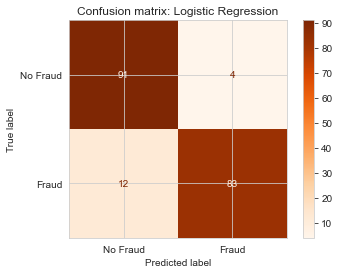

In [63]:
# Replace 0 and 1 with 'No Fraud' and 'Fraud'.
labels = ['No Fraud', 'Fraud']
# Plot confusion matrix.
plot_confusion_matrix(model_logistic_regression, 
                      X_test, 
                      Y_test, 
                      display_labels=labels, 
                      cmap=plt.cm.Oranges)
plt.title("Confusion matrix: Logistic Regression")
plt.show()

[Text(0, 0, 'Time'),
 Text(1, 0, 'V1'),
 Text(2, 0, 'V2'),
 Text(3, 0, 'V3'),
 Text(4, 0, 'V4'),
 Text(5, 0, 'V5'),
 Text(6, 0, 'V6'),
 Text(7, 0, 'V7'),
 Text(8, 0, 'V8'),
 Text(9, 0, 'V9'),
 Text(10, 0, 'V10'),
 Text(11, 0, 'V11'),
 Text(12, 0, 'V12'),
 Text(13, 0, 'V13'),
 Text(14, 0, 'V14'),
 Text(15, 0, 'V15'),
 Text(16, 0, 'V16'),
 Text(17, 0, 'V17'),
 Text(18, 0, 'V18'),
 Text(19, 0, 'V19'),
 Text(20, 0, 'V20'),
 Text(21, 0, 'V21'),
 Text(22, 0, 'V22'),
 Text(23, 0, 'V23'),
 Text(24, 0, 'V24'),
 Text(25, 0, 'V25'),
 Text(26, 0, 'V26'),
 Text(27, 0, 'V27'),
 Text(28, 0, 'V28'),
 Text(29, 0, 'Amount'),
 Text(30, 0, 'Class')]

Text(0.5, 0, 'Features')

Text(0.5, 1.0, 'Feature importance')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]),
 [Text(0, 0, 'Time'),
  Text(1, 0, 'V1'),
  Text(2, 0, 'V2'),
  Text(3, 0, 'V3'),
  Text(4, 0, 'V4'),
  Text(5, 0, 'V5'),
  Text(6, 0, 'V6'),
  Text(7, 0, 'V7'),
  Text(8, 0, 'V8'),
  Text(9, 0, 'V9'),
  Text(10, 0, 'V10'),
  Text(11, 0, 'V11'),
  Text(12, 0, 'V12'),
  Text(13, 0, 'V13'),
  Text(14, 0, 'V14'),
  Text(15, 0, 'V15'),
  Text(16, 0, 'V16'),
  Text(17, 0, 'V17'),
  Text(18, 0, 'V18'),
  Text(19, 0, 'V19'),
  Text(20, 0, 'V20'),
  Text(21, 0, 'V21'),
  Text(22, 0, 'V22'),
  Text(23, 0, 'V23'),
  Text(24, 0, 'V24'),
  Text(25, 0, 'V25'),
  Text(26, 0, 'V26'),
  Text(27, 0, 'V27'),
  Text(28, 0, 'V28'),
  Text(29, 0, 'Amount'),
  Text(30, 0, 'Class')])

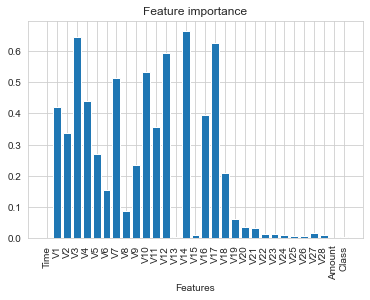

In [64]:
# Additional Logistic Regression analysis - feature importance via model coefficients.
# Get importance.
importance = abs(model_logistic_regression.coef_).squeeze()
# Get variable names.
features = list(df.columns[:-1])
# Plot feature importance.
fig, ax = plt.subplots()
x_pos = np.arange(len(features))
hbars = ax.bar(x_pos, importance, align='center')
ax.set_xticks(x_pos)
ax.set_xticklabels(features)
ax.set_xlabel('Features')
ax.set_title('Feature importance')

plt.xticks(rotation=90)
plt.show()

# RANDOM FOREST 

In [65]:
# Import random forest classifier.
from sklearn.ensemble import RandomForestClassifier
# Fit model.
model_random_forest = RandomForestClassifier(max_depth=20)
model_random_forest.fit(X_train, Y_train)

RandomForestClassifier(max_depth=20)

In [66]:
# Get predicted labels.
Y_pred_random_forest = get_Y_pred(model_random_forest, X_test)
# Get confusion matrix.
cf_random_forest = confusion_matrix(Y_test, Y_pred_random_forest)
print(cf_random_forest)

[[94  1]
 [ 9 86]]


In [67]:
#Model Evaluation
#Accuracy Score
# accuracy on training data
X_train_prediction = model_random_forest.predict(X_train)
training_data_accuracy = accuracy_score(X_train_prediction, Y_train)

In [68]:
print('Accuracy on Training data : ', training_data_accuracy)

Accuracy on Training data :  1.0


In [69]:
# accuracy on test data
X_test_prediction = model_random_forest.predict(X_test)
test_data_accuracy = accuracy_score(X_test_prediction, Y_test)

In [70]:
print('Accuracy score on Test Data : ', test_data_accuracy)

Accuracy score on Test Data :  0.9473684210526315


In [71]:
# Show confusion matrix derivations.
get_metrics(cf_random_forest)
get_roc_auc_score(Y_test, Y_pred_random_forest)

True positive: 94
True negative: 86
False positive/Type I error: 9
False negative/Type II error: 1
Sensitivity: 0.9894736842105263
Specificity: 0.9052631578947369
Precision: 0.912621359223301
Negative predictive value: 0.9885057471264368
False positive rate: 0.010526315789473717
False negative rate: 0.09473684210526312
Accuracy: 0.9473684210526315
ROC_AUC score:  0.9473684210526316


Text(0.5, 1.0, 'Confusion matrix: Random Forest')

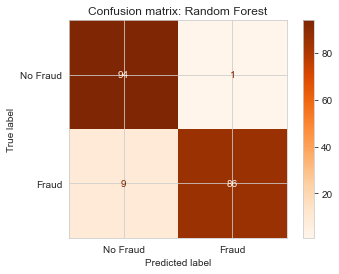

In [72]:
# Plot confusion matrix.
plot_confusion_matrix(model_random_forest, 
                      X_test, 
                      Y_test, 
                      display_labels=labels, 
                      cmap=plt.cm.Oranges)
plt.title("Confusion matrix: Random Forest")
plt.show()

The Accuracy of Logistic Regression Classifier is 91.57% 
The Accuracy of Random Forest Classifier is 93.15%
Therefore accuracy of Random Forest Classifier Model is higher than Logistic Regression Classifier and we can conclude that Random Forest Classifier is better Model for this Data Set. 